Model Accuracy: 0.886822009007245

Classification Report:
               precision    recall  f1-score   support

           0       0.89      1.00      0.94     45170
           1       0.63      0.05      0.09      5900

    accuracy                           0.89     51070
   macro avg       0.76      0.52      0.51     51070
weighted avg       0.86      0.89      0.84     51070



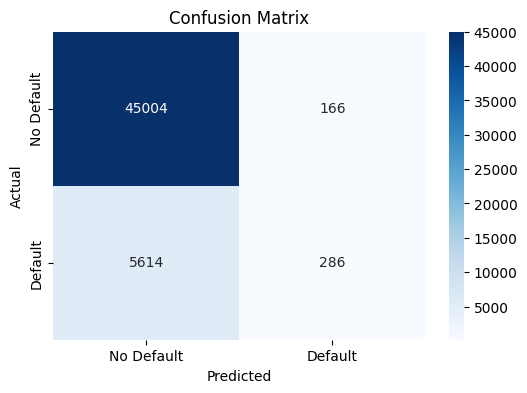

Loan Default Prediction (1=Default, 0=No Default): 0


/home/codespace/.local/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
# Load dataset
file_path = "/workspaces/Understanding-Business-Problems/Loan_default.csv" # 🔹 Update this path
df = pd.read_csv(file_path)
# Drop LoanID (not useful for prediction)
df.drop(columns=["LoanID"], inplace=True)
# Encode categorical variables
categorical_cols = ["Education", "EmploymentType", "MaritalStatus", "LoanPurpose",
"HasMortgage", "HasDependents", "HasCoSigner"]
for col in categorical_cols:
    df[col] = LabelEncoder().fit_transform(df[col])
# Define features (X) and target (y)
X = df.drop(columns=["Default"])
y = df["Default"]
# Split data into training and test sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# Standardize numerical features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)
# Train Random Forest Classifier
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train)
# Predictions
y_pred = model.predict(X_test)
# Model Evaluation
accuracy = accuracy_score(y_test, y_pred)
print("Model Accuracy:", accuracy)
print("\nClassification Report:\n", classification_report(y_test, y_pred))
# Confusion Matrix Visualization
plt.figure(figsize=(6,4))
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt='d', cmap="Blues",
xticklabels=["No Default", "Default"], yticklabels=["No Default", "Default"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()
# Predict a new borrower's default status
new_borrower = np.array([[35, 5000, 20000, 720, 36, 3, 7.5, 60, 25, 2, 1, 0, 1, 1, 0, 0]])
new_borrower = scaler.transform(new_borrower) # Standardize
prediction = model.predict(new_borrower)
print("Loan Default Prediction (1=Default, 0=No Default):", prediction[0])

In [6]:
# Perform univariate analysis
univariate_analysis = df.describe()

# Display the results
print(univariate_analysis)

                 Age         Income     LoanAmount    CreditScore  \
count  255347.000000  255347.000000  255347.000000  255347.000000   
mean       43.498306   82499.304597  127578.865512     574.264346   
std        14.990258   38963.013729   70840.706142     158.903867   
min        18.000000   15000.000000    5000.000000     300.000000   
25%        31.000000   48825.500000   66156.000000     437.000000   
50%        43.000000   82466.000000  127556.000000     574.000000   
75%        56.000000  116219.000000  188985.000000     712.000000   
max        69.000000  149999.000000  249999.000000     849.000000   

       MonthsEmployed  NumCreditLines   InterestRate       LoanTerm  \
count   255347.000000   255347.000000  255347.000000  255347.000000   
mean        59.541976        2.501036      13.492773      36.025894   
std         34.643376        1.117018       6.636443      16.969330   
min          0.000000        1.000000       2.000000      12.000000   
25%         30.000000  

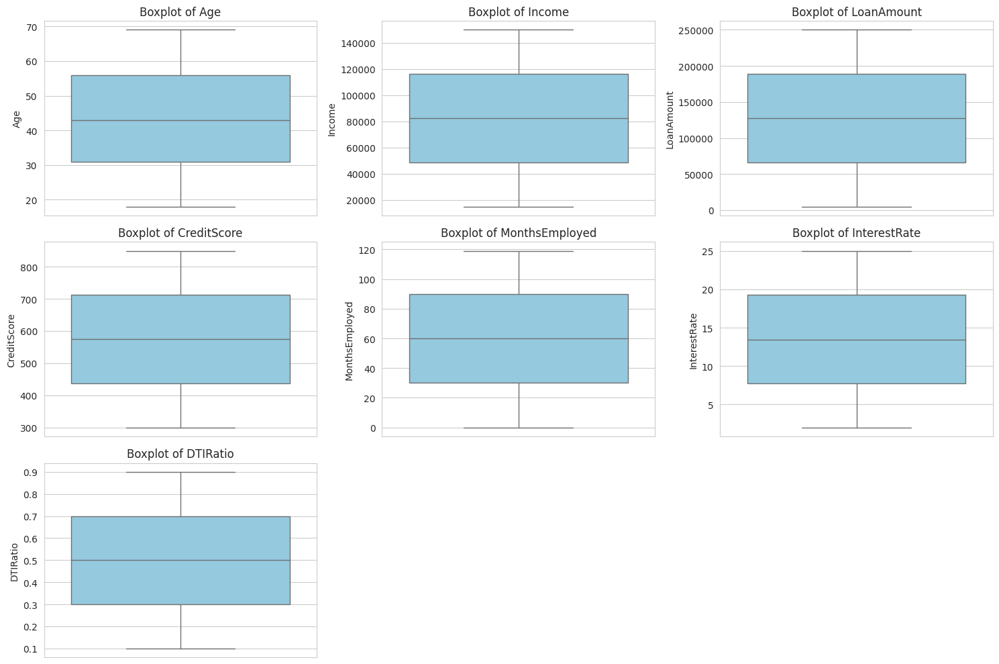

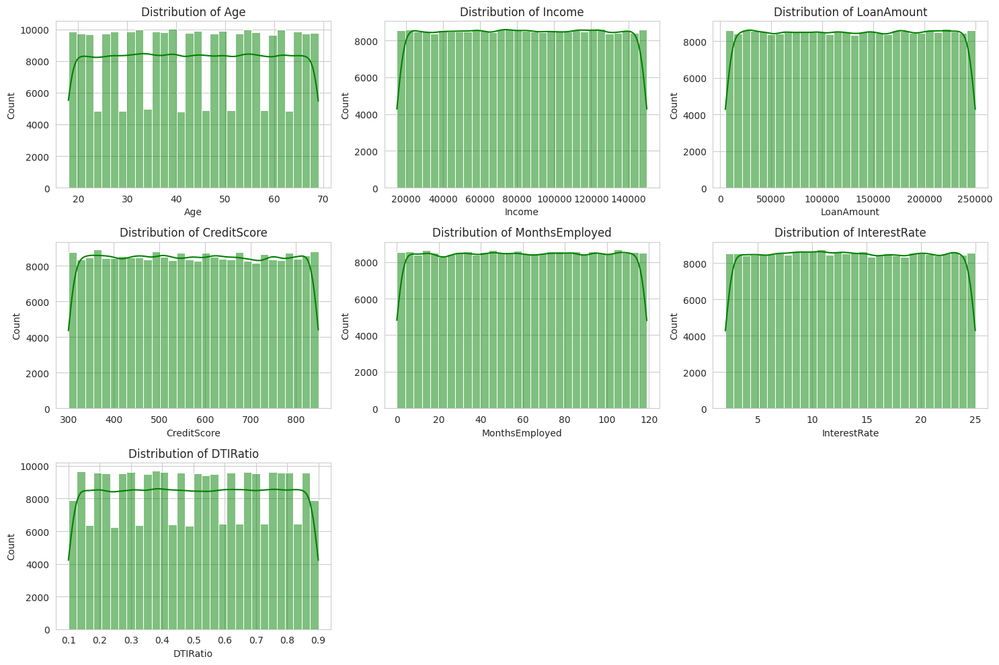

Age: 0 outliers
Income: 0 outliers
LoanAmount: 0 outliers
CreditScore: 0 outliers
MonthsEmployed: 0 outliers
InterestRate: 0 outliers
DTIRatio: 0 outliers


In [7]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset (assuming it is in a CSV file)
df = pd.read_csv('/workspaces/Understanding-Business-Problems/Loan_default.csv')  # Replace with actual file path

# Set plot style
sns.set_style("whitegrid")

# List of numerical columns to analyze
num_cols = ['Age', 'Income', 'LoanAmount', 'CreditScore', 'MonthsEmployed', 'InterestRate', 'DTIRatio']

# Creating boxplots to visualize outliers
plt.figure(figsize=(15, 10))
for i, col in enumerate(num_cols, 1):
    plt.subplot(3, 3, i)
    sns.boxplot(y=df[col], color='skyblue')
    plt.title(f'Boxplot of {col}')
plt.tight_layout()
plt.show()

# Creating histograms to visualize distributions
plt.figure(figsize=(15, 10))
for i, col in enumerate(num_cols, 1):
    plt.subplot(3, 3, i)
    sns.histplot(df[col], bins=30, kde=True, color='green')
    plt.title(f'Distribution of {col}')
plt.tight_layout()
plt.show()

# Detecting outliers using IQR method
outliers = {}
for col in num_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers[col] = df[(df[col] < lower_bound) | (df[col] > upper_bound)][col]

# Printing number of outliers per column
for col, values in outliers.items():
    print(f"{col}: {len(values)} outliers")


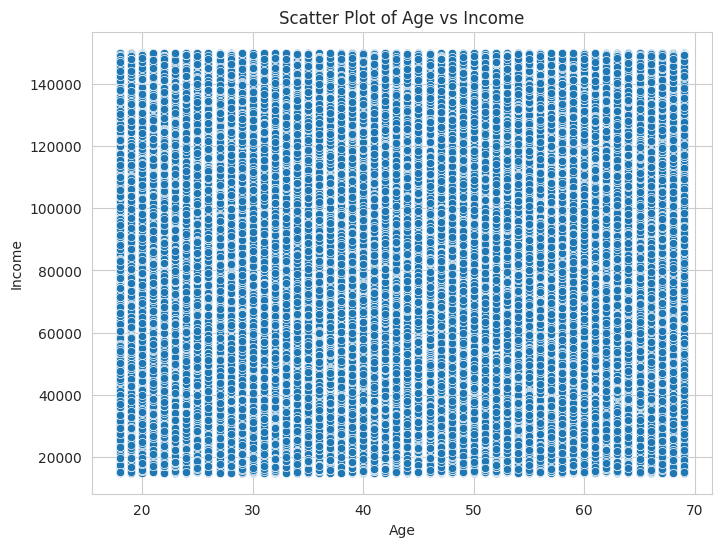

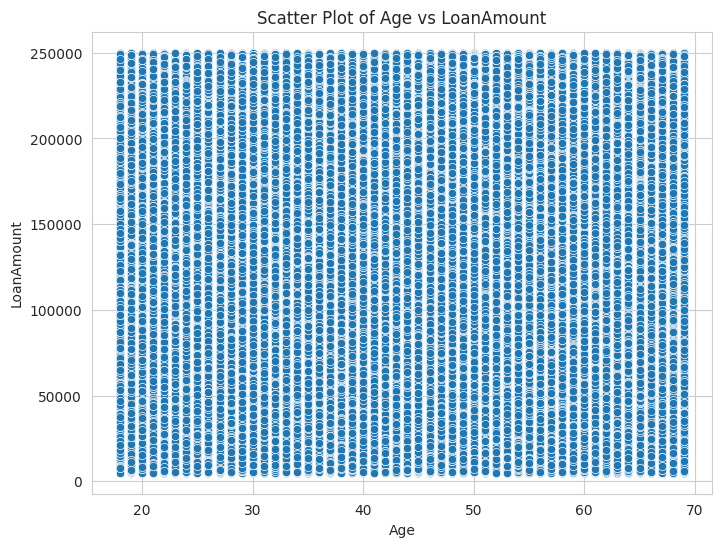

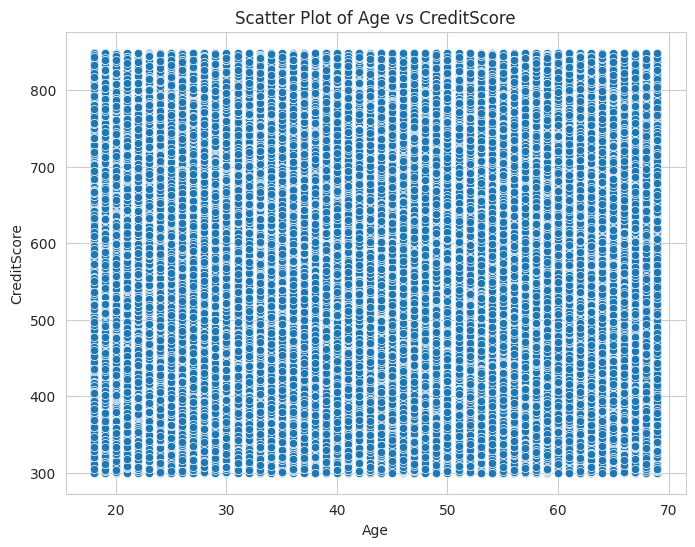

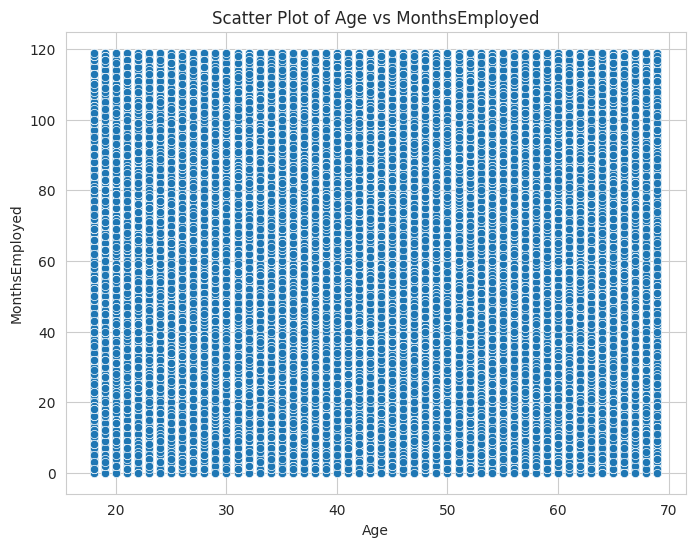

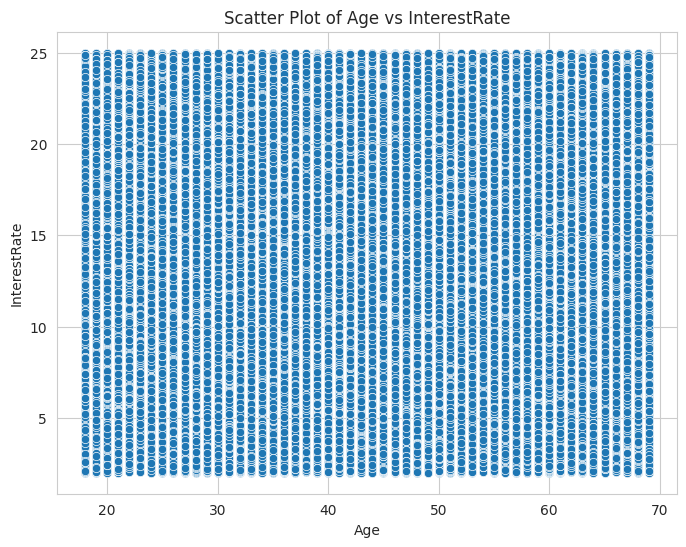

...

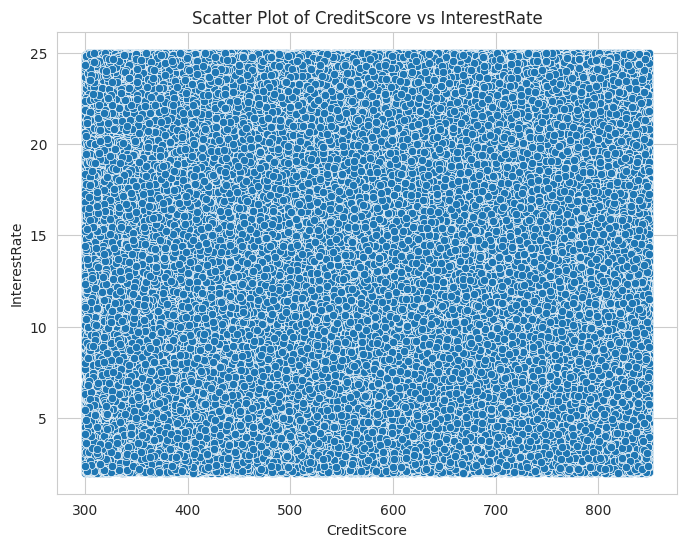

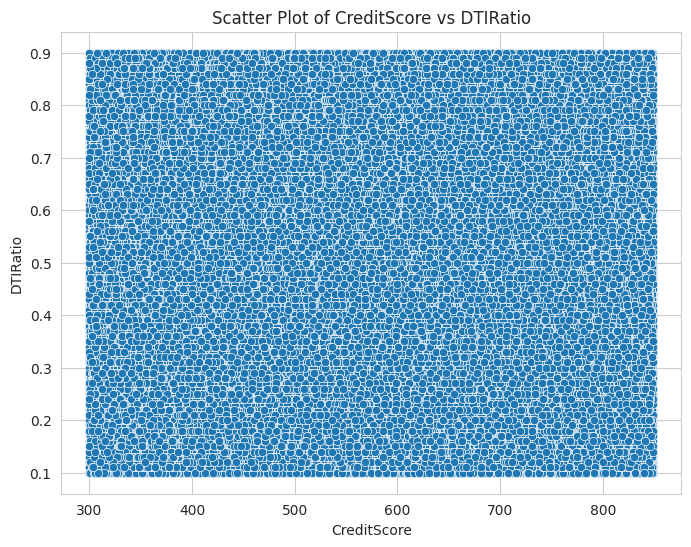

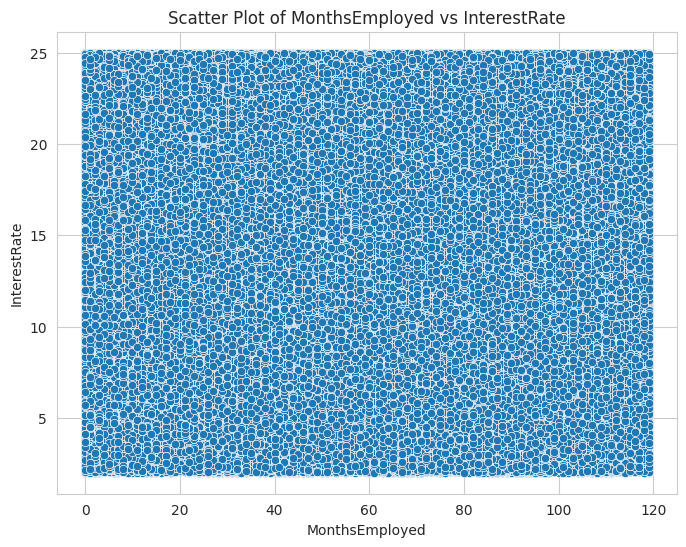

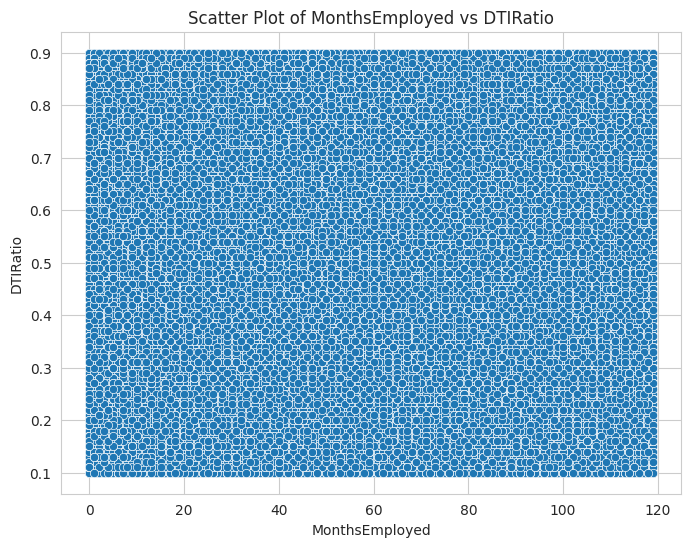

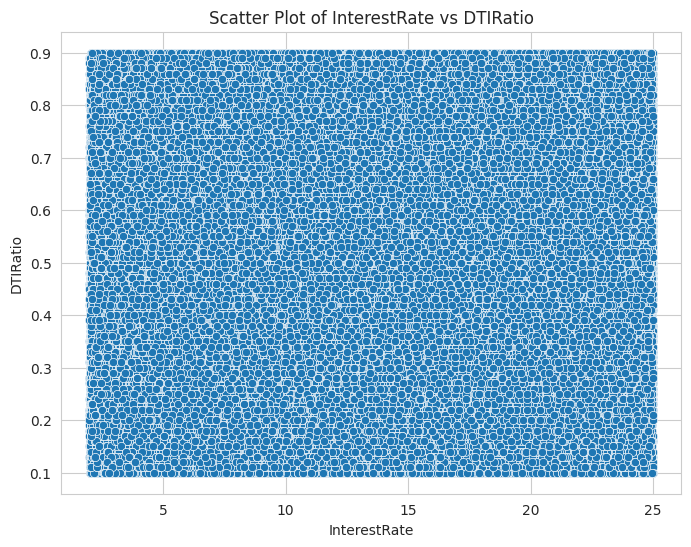

In [8]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Specify the file path for your dataset
file_path = '/workspaces/Understanding-Business-Problems/Loan_default.csv'  # Replace with your actual file path

# Load the dataset into a DataFrame
df = pd.read_csv(file_path)

# List of relevant columns
columns = ['Age', 'Income', 'LoanAmount', 'CreditScore', 'MonthsEmployed', 'InterestRate', 'DTIRatio']

# Create scatter plots for each pair of variables
for i in range(len(columns)):
    for j in range(i + 1, len(columns)):
        plt.figure(figsize=(8, 6))
        sns.scatterplot(x=df[columns[i]], y=df[columns[j]])
        plt.title(f'Scatter Plot of {columns[i]} vs {columns[j]}')
        plt.xlabel(columns[i])
        plt.ylabel(columns[j])
        plt.show()


In [9]:
import pandas as pd

# Load your dataset
file_path = '/workspaces/Understanding-Business-Problems/Loan_default.csv'  # Update with your file path
df = pd.read_csv(file_path)

# List of relevant columns
columns = ['Age', 'Income', 'LoanAmount', 'CreditScore', 'MonthsEmployed', 'InterestRate', 'DTIRatio']

# Function to identify and treat outliers using IQR
def treat_outliers(df, columns):
    treated_df = df.copy()
    
    for column in columns:
        # Calculate the IQR
        Q1 = treated_df[column].quantile(0.25)
        Q3 = treated_df[column].quantile(0.75)
        IQR = Q3 - Q1
        
        # Define the bounds for identifying outliers
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        
        # Identify outliers
        outliers = treated_df[(treated_df[column] < lower_bound) | (treated_df[column] > upper_bound)]
        
        print(f"Outliers in {column}:")
        print(outliers)
        
        # Option 1: Removing outliers
        treated_df = treated_df[(treated_df[column] >= lower_bound) & (treated_df[column] <= upper_bound)]
        
        # Option 2: Capping outliers (Winsorization)
        # treated_df[column] = np.where(treated_df[column] < lower_bound, lower_bound, 
        #                                np.where(treated_df[column] > upper_bound, upper_bound, treated_df[column]))
        
    return treated_df

# Treat outliers in the dataset
treated_df = treat_outliers(df, columns)

# Optionally, save the treated data to a new file
# treated_df.to_csv('/workspaces/Understanding-Business-Problems/Loan_default.csv', index=False)

Outliers in Age:
Empty DataFrame
Columns: [LoanID, Age, Income, LoanAmount, CreditScore, MonthsEmployed, NumCreditLines, InterestRate, LoanTerm, DTIRatio, Education, EmploymentType, MaritalStatus, HasMortgage, HasDependents, LoanPurpose, HasCoSigner, Default]
Index: []
Outliers in Income:
Empty DataFrame
Columns: [LoanID, Age, Income, LoanAmount, CreditScore, MonthsEmployed, NumCreditLines, InterestRate, LoanTerm, DTIRatio, Education, EmploymentType, MaritalStatus, HasMortgage, HasDependents, LoanPurpose, HasCoSigner, Default]
Index: []
Outliers in LoanAmount:
Empty DataFrame
Columns: [LoanID, Age, Income, LoanAmount, CreditScore, MonthsEmployed, NumCreditLines, InterestRate, LoanTerm, DTIRatio, Education, EmploymentType, MaritalStatus, HasMortgage, HasDependents, LoanPurpose, HasCoSigner, Default]
Index: []
Outliers in CreditScore:
Empty DataFrame
Columns: [LoanID, Age, Income, LoanAmount, CreditScore, MonthsEmployed, NumCreditLines, InterestRate, LoanTerm, DTIRatio, Education, Employ

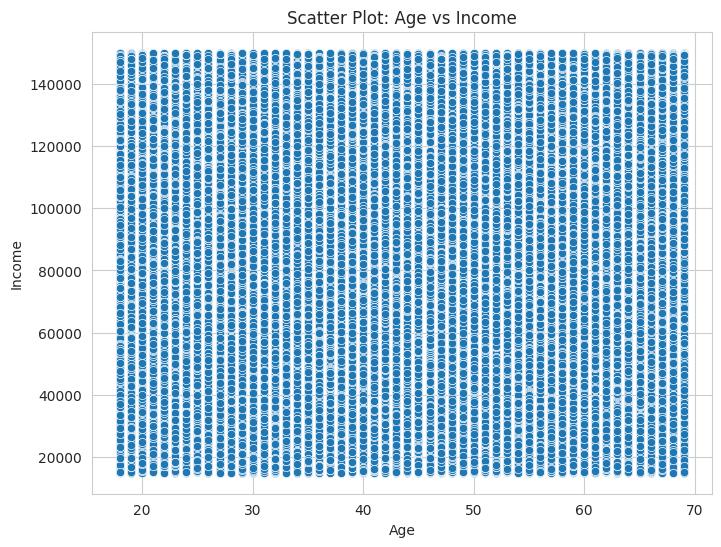

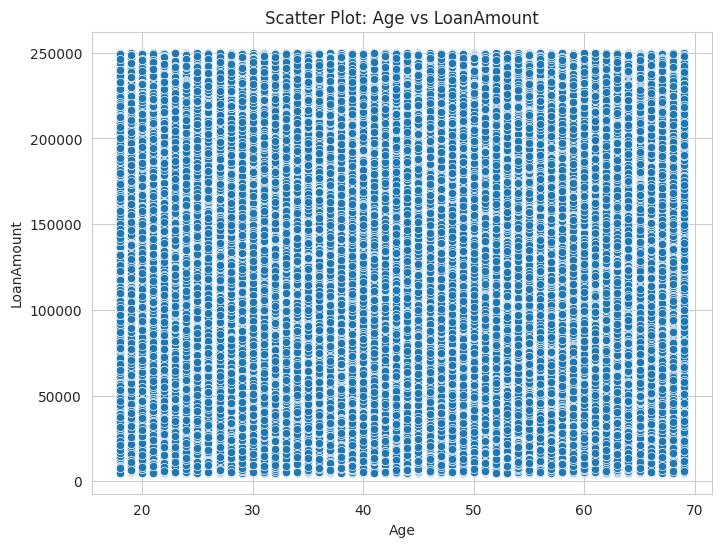

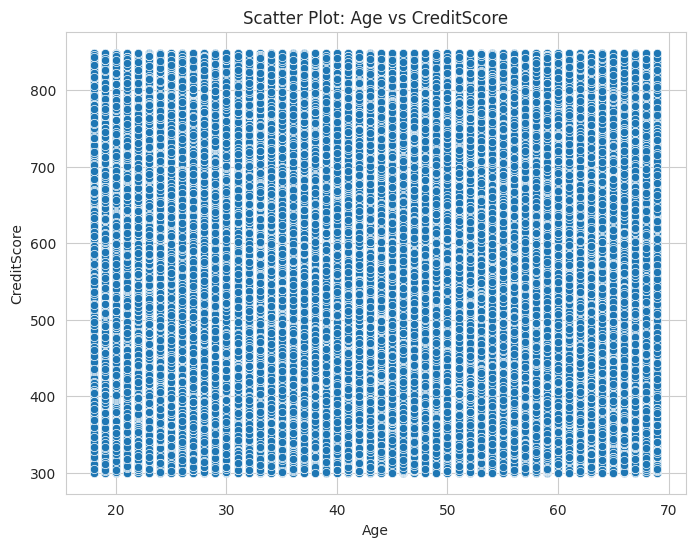

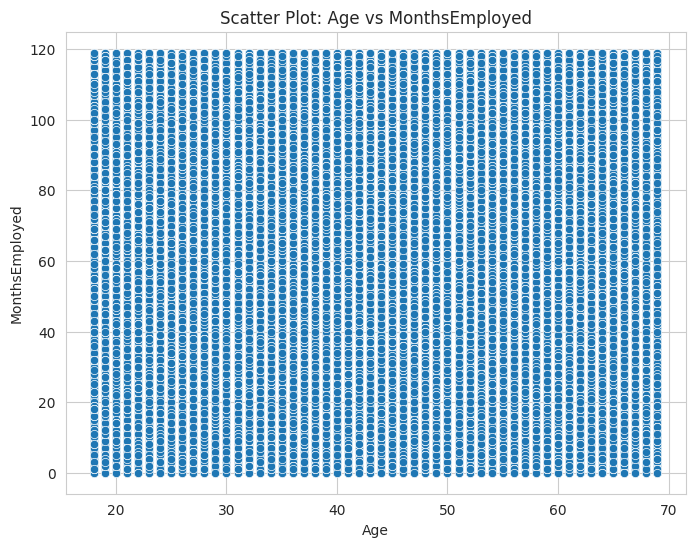

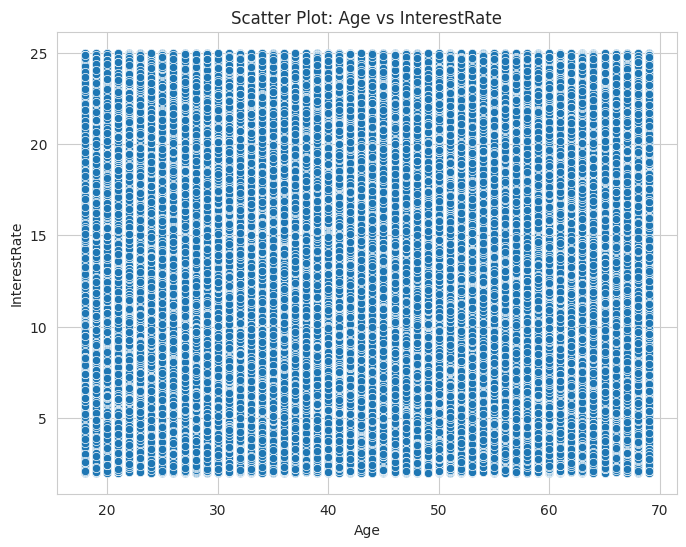

...

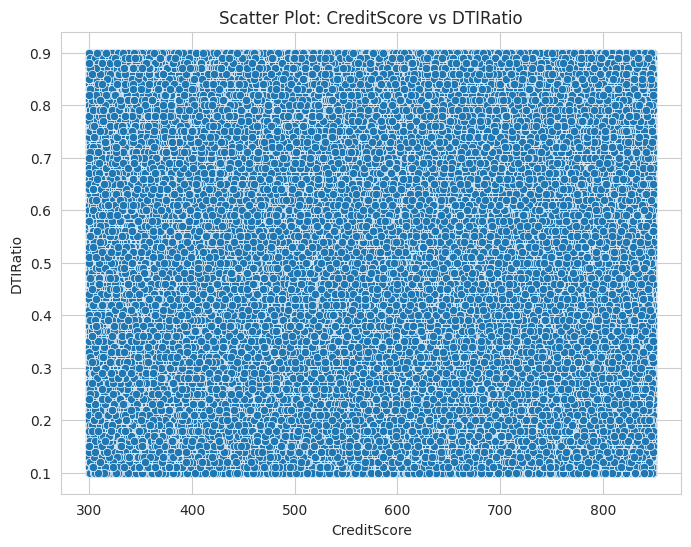

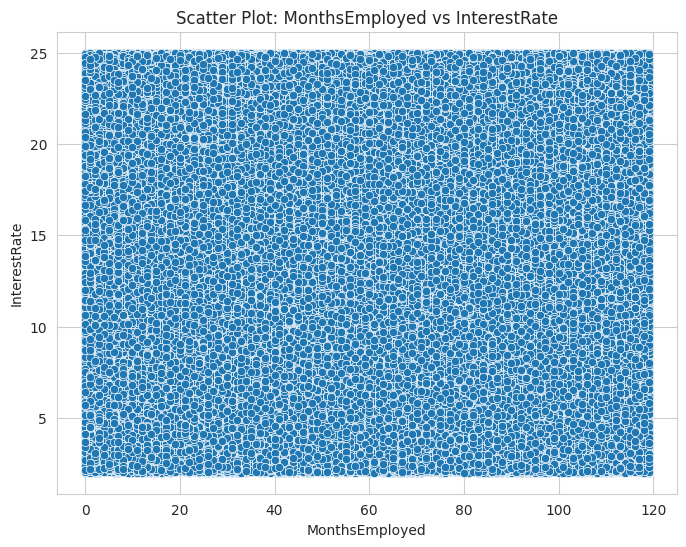

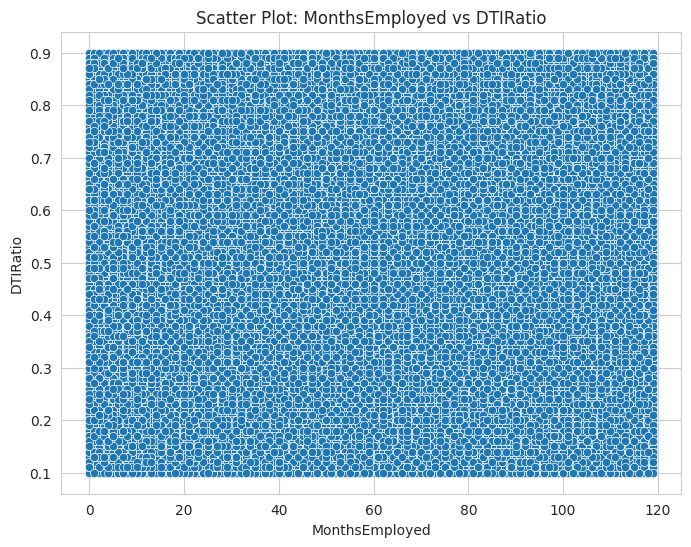

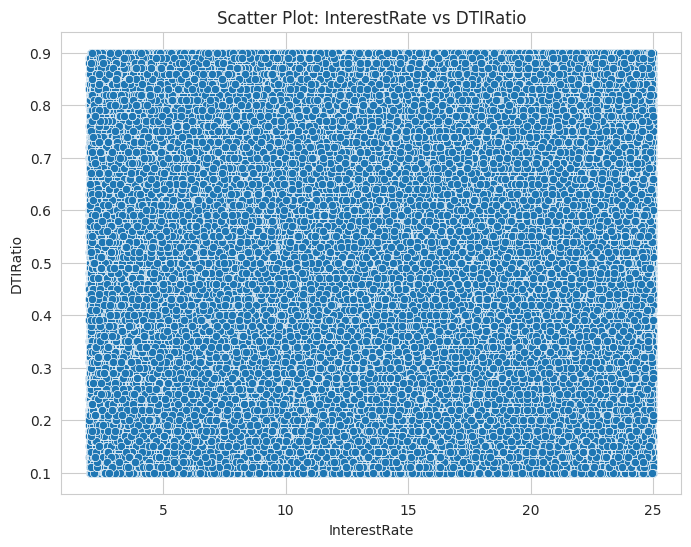

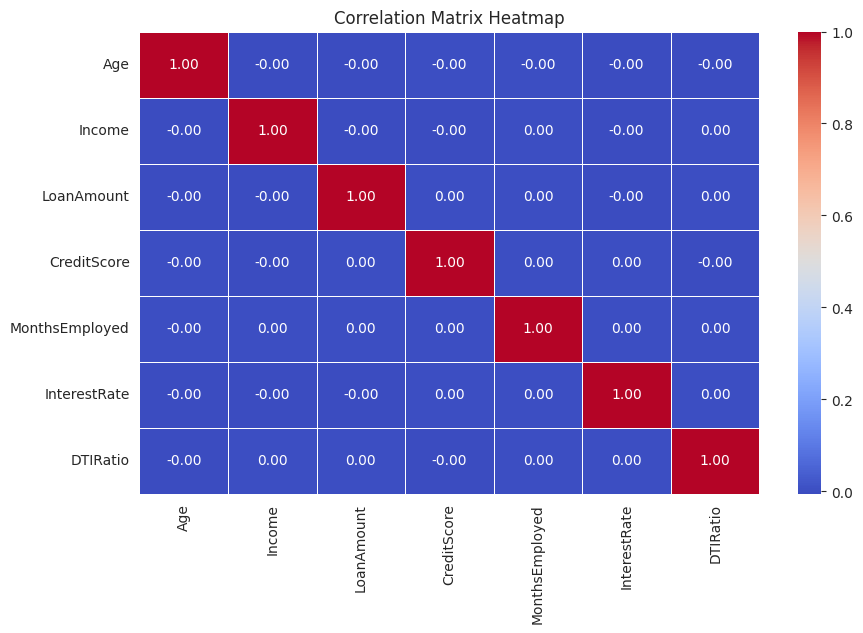

In [10]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the dataset
file_path = '/workspaces/Understanding-Business-Problems/Loan_default.csv'  # Replace with actual file path
df = pd.read_csv(file_path)

# List of numerical variables
columns = ['Age', 'Income', 'LoanAmount', 'CreditScore', 'MonthsEmployed', 'InterestRate', 'DTIRatio']

# Scatter plots to visualize relationships
for i in range(len(columns)):
    for j in range(i + 1, len(columns)):
        plt.figure(figsize=(8, 6))
        sns.scatterplot(x=df[columns[i]], y=df[columns[j]])
        plt.title(f'Scatter Plot: {columns[i]} vs {columns[j]}')
        plt.xlabel(columns[i])
        plt.ylabel(columns[j])
        plt.show()

# Compute correlation matrix
correlation_matrix = df[columns].corr()

# Heatmap to visualize correlation
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title("Correlation Matrix Heatmap")
plt.show()

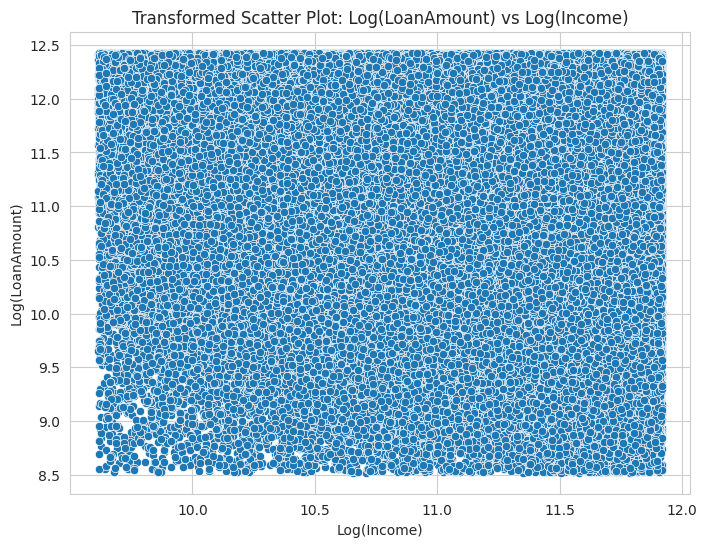

Original Correlation: -0.00
Transformed Correlation: -0.00


In [11]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load the dataset
file_path = '/workspaces/Understanding-Business-Problems/Loan_default.csv'  # Replace with actual file path
df = pd.read_csv(file_path)

# Identify nonlinear relationships from previous scatter plots
# Assume 'LoanAmount' vs 'Income' showed a nonlinear relationship

# Applying Log Transformation
df['LoanAmount_log'] = np.log1p(df['LoanAmount'])  # log1p avoids log(0) issues
df['Income_log'] = np.log1p(df['Income'])

# Scatter plot after transformation
plt.figure(figsize=(8, 6))
sns.scatterplot(x=df['Income_log'], y=df['LoanAmount_log'])
plt.title('Transformed Scatter Plot: Log(LoanAmount) vs Log(Income)')
plt.xlabel('Log(Income)')
plt.ylabel('Log(LoanAmount)')
plt.show()

# Checking the correlation after transformation
corr_original = df[['LoanAmount', 'Income']].corr().iloc[0, 1]
corr_transformed = df[['LoanAmount_log', 'Income_log']].corr().iloc[0, 1]

print(f"Original Correlation: {corr_original:.2f}")
print(f"Transformed Correlation: {corr_transformed:.2f}")

In [15]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from category_encoders import HashingEncoder

# Load dataset
file_path = '/workspaces/Understanding-Business-Problems/Loan_default.csv'  # Replace with your actual file path
df = pd.read_csv(file_path)

# Identify categorical columns
categorical_columns = df.select_dtypes(include=['object']).columns

# Check cardinality of each categorical column
cardinality_thresholds = {'low': 10, 'high': 100}
low_cardinality_cols = []
medium_cardinality_cols = []
high_cardinality_cols = []

for col in categorical_columns:
    unique_count = df[col].nunique()
    if unique_count <= cardinality_thresholds['low']:
        low_cardinality_cols.append(col)  # One-Hot Encoding
    elif unique_count <= cardinality_thresholds['high']:
        medium_cardinality_cols.append(col)  # Label Encoding
    else:
        high_cardinality_cols.append(col)  # Hashing/Frequency Encoding

# Apply One-Hot Encoding for Low Cardinality Variables
df = pd.get_dummies(df, columns=low_cardinality_cols, drop_first=True)

# Apply Label Encoding for Medium Cardinality Variables
label_enc = LabelEncoder()
for col in medium_cardinality_cols:
    df[col] = label_enc.fit_transform(df[col])

# Apply Frequency Encoding for High Cardinality Variables
for col in high_cardinality_cols:
    df[col] = df[col].map(df[col].value_counts(normalize=True))

# Save processed dataset
processed_file_path = '/workspaces/Understanding-Business-Problems/Loan_default.csv'  # Update the path
df.to_csv(processed_file_path, index=False)

# Display final dataset info
print("Categorical encoding completed. Processed dataset saved.")
print(df.head())

Categorical encoding completed. Processed dataset saved.
     LoanID  Age  Income  LoanAmount  CreditScore  MonthsEmployed  \
0  0.000004   56   85994       50587          520              80   
1  0.000004   69   50432      124440          458              15   
2  0.000004   46   84208      129188          451              26   
3  0.000004   32   31713       44799          743               0   
4  0.000004   60   20437        9139          633               8   

   NumCreditLines  InterestRate  LoanTerm  DTIRatio  ...  \
0               4         15.23        36      0.44  ...   
1               1          4.81        60      0.68  ...   
2               3         21.17        24      0.31  ...   
3               3          7.07        24      0.23  ...   
4               4          6.51        48      0.73  ...   

   EmploymentType_Unemployed  MaritalStatus_Married  MaritalStatus_Single  \
0                      False                  False                 False   
1            

In [17]:
import pandas as pd
import numpy as np
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Load the process/workspaces/Understanding-Business-Problems/Loan_default.csved dataset
df = pd.read_csv("/workspaces/Understanding-Business-Problems/Loan_default.csv")

# Dropping non-numeric columns (if any exist)
numeric_df = df.select_dtypes(include=[np.number])

# Dropping the LoanID column if it exists, as it is an identifier and not useful for VIF analysis
if 'LoanID' in numeric_df.columns:
    numeric_df = numeric_df.drop(columns=['LoanID'])

# Calculating VIF
vif_data = pd.DataFrame()
vif_data["Feature"] = numeric_df.columns
vif_data["VIF"] = [variance_inflation_factor(numeric_df.values, i) for i in range(len(numeric_df.columns))]

# Displaying VIF values
print("Variance Inflation Factor (VIF) values:")
print(vif_data)

# Interpretation:
# - VIF > 10 indicates high multicollinearity and suggests that the feature should be removed or transformed.
# - VIF between 5-10 suggests moderate multicollinearity.
# - VIF < 5 is generally acceptable.


Variance Inflation Factor (VIF) values:
          Feature        VIF
0             Age   8.004979
1          Income   5.023767
2      LoanAmount   4.038715
3     CreditScore  10.508710
4  MonthsEmployed   3.752786
5  NumCreditLines   5.452258
6    InterestRate   4.865622
7        LoanTerm   5.038043
8        DTIRatio   5.188520
9         Default   1.205238
